In [1]:
# https://flothesof.github.io/removing-background-scikit-image.html

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

#== Parameters =======================================================================
BLUR = 21
CANNY_THRESH_1 = 2
CANNY_THRESH_2 = 32
MASK_DILATE_ITER = 10
MASK_ERODE_ITER = 10
MASK_COLOR = (1.0,0.0,0.0) # In BGR format



In [11]:
def preprocessImg(img, new_width=400, new_height=300):
    new_dim = (new_width, new_height)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # cv2 stores bgr, change to rgb (to display for human eye)
    img = cv2.resize(img, new_dim, interpolation=cv2.INTER_LINEAR) # resize image
    img = img[2:-2][:] # crop image on four sides
#     img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # apply grey scale
#     img = cv2.GaussianBlur(img, (5, 5), 0) # apply Gausian blur
#     img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2) # apply adaptive thresholding
#     img = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
#     display_img(img)
#     desc = LocalBinaryPatterns(24, 8) # perform LBP on image
#     hist = desc.describe(img)
    return img
# # read train image


train_dataset = []
path = './data/Train/'
files = os.listdir(path)

# for file in train_files[:2500]: # get first 300 images
for file in files[:100]:
    p = path + file
    img = cv2.imread(p)
    train_dataset.append(preprocessImg(img))

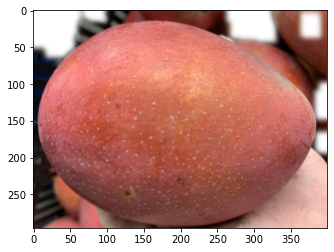

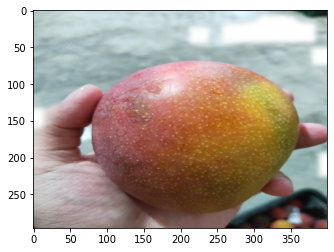

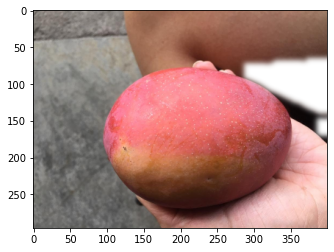

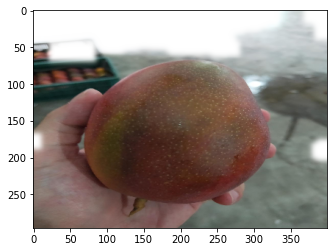

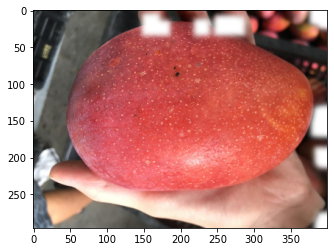

...

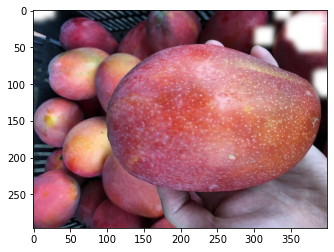

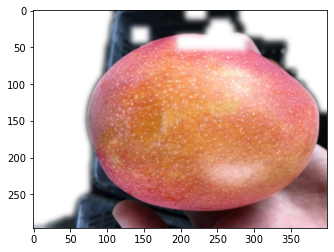

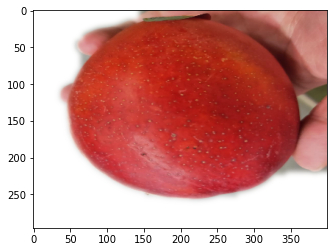

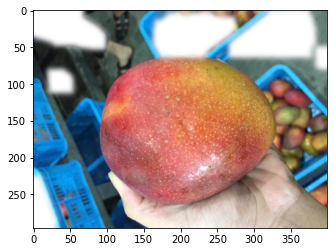

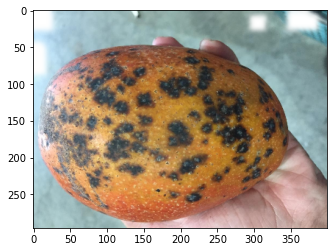

In [16]:
#== Processing =======================================================================

for img in train_dataset:
    #-- Read image -----------------------------------------------------------------------
#     img = cv2.imread(image_file)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    #-- Edge detection -------------------------------------------------------------------
    edges = cv2.Canny(gray, CANNY_THRESH_1, CANNY_THRESH_2)
    edges = cv2.dilate(edges, None)
    edges = cv2.erode(edges, None)

    #-- Find contours in edges, sort by area ---------------------------------------------
    contour_info = []
    # _, contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    # Previously, for a previous version of cv2, this line was: 
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    # Thanks to notes from commenters, I've updated the code but left this note
    for c in contours:
        contour_info.append((
            c,
            cv2.isContourConvex(c),
            cv2.contourArea(c),
        ))
    contour_info = sorted(contour_info, key=lambda c: c[2], reverse=True)
    max_contour = contour_info[0]

    #-- Create empty mask, draw filled polygon on it corresponding to largest contour ----
    # Mask is black, polygon is white
    mask = np.zeros(edges.shape)
    cv2.fillConvexPoly(mask, max_contour[0], (255))

    #-- Smooth mask, then blur it --------------------------------------------------------
    mask = cv2.dilate(mask, None, iterations=MASK_DILATE_ITER)
    mask = cv2.erode(mask, None, iterations=MASK_ERODE_ITER)
    mask = cv2.GaussianBlur(mask, (BLUR, BLUR), 0)
    mask_stack = np.dstack([mask]*3)    # Create 3-channel alpha mask

    #-- Blend masked img into MASK_COLOR background --------------------------------------
    mask_stack  = mask_stack.astype('float32') / 255.0          # Use float matrices, 
    img         = img.astype('float32') / 255.0                 #  for easy blending

    masked = (mask_stack * img) + ((1-mask_stack) * MASK_COLOR) # Blend
    masked = (masked * 255).astype('uint8')                     # Convert back to 8-bit 


    c_red, c_green, c_blue = cv2.split(img)
    img_a = cv2.merge((c_red, c_green, c_blue, mask.astype('float32') / 255.0))
    %matplotlib inline
    plt.imshow(img_a)
    plt.show()
    

    # cv2.imshow('img', masked)                                   # Display
    # cv2.waitKey(0)

    #cv2.imwrite('C:/Temp/person-masked.jpg', masked)           # Save